<a href="https://colab.research.google.com/github/GeremiaPompei/ISPR/blob/main/midterm2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ISP Midterm 2 - Assignment 2 - Pompei Geremia (MAT. 638432)

## Code

### Initialization

Initial part is composed by the commands that allow to download the zip containing the dataset and extract from this the images.

In [1]:
!rm -rf MSRC_ObjCategImageDatabase_v1
!wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
!unzip msrc_objcategimagedatabase_v1.zip
!rm -rf msrc_objcategimagedatabase_v1.zip

--2022-04-10 16:35:30--  http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.1.244.151, 2600:1406:3c:49b::e59, 2600:1406:3c:483::e59
Connecting to download.microsoft.com (download.microsoft.com)|23.1.244.151|:80... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip [following]
--2022-04-10 16:35:30--  https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Connecting to download.microsoft.com (download.microsoft.com)|23.1.244.151|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44119839 (42M) [application/octet-stream]
Saving to: ‘msrc_objcategimagedatabase_v1.zip’

msrc_objcategimaged 100%[===================>]  42.08M   128MB/s

The following part imports all the libraries useful for running all the tests.

In [2]:
!pip install opencv-contrib-python==4.4.0.44
import cv2
from google.colab.patches import cv2_imshow

from functools import reduce
from random import seed, shuffle, randint

import numpy as np

from os import listdir
from os.path import join

from scipy.cluster import vq

from gensim.models.ldamulticore import LdaModel

%matplotlib inline
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

Now it's initialized a list of paths of images for each topic of dataset and is inserted in a list. It's also fixed an image for the preliminar tests and the random seed to a fixed number.

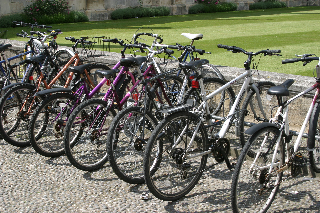

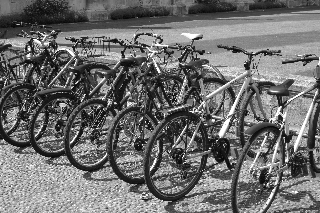

In [3]:
#@title Initial Settings

random_seed = 0#@param {type:"number", min:0}
seed(random_seed)

images_dir = "MSRC_ObjCategImageDatabase_v1"

images_paths = {}
for fn in listdir(images_dir):
  if "_GT" not in fn:
    if fn[0] in images_paths:
      images_paths[fn[0]].append(join(images_dir, fn))
    else:
      images_paths[fn[0]] = [join(images_dir, fn)]
images_paths = list(images_paths.values())

fpath = images_paths[0][0]
img = cv2.imread(fpath)
bw_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

cv2_imshow(img)
cv2_imshow(bw_img)

This function allows to print different images in a single row. All pictures can be displayed if they have the same height.

In [4]:
def show(images):
  cv2_imshow(np.concatenate(images, axis=1))

*ImgData* is a class useful to handle in a better way information of an image  (keypoints, descriptors, ...).

In [5]:
class ImgData:
  
  def __init__(self, path, kp, des):
    self.path = path
    self.kp = kp
    self.des = des
    self.feature_topics = np.array([]) 
    self.img_topics = np.array([]) 
    self.code = None
    self.histogram = None
    self.med = None
    self.topics_detected_img = None

*Topic* is a class built to have a representation of topic with some minimal features and a relationship with a list of image with this as main topic. The static method is used to create a list of topic in an automatic way.

In [6]:
class Topic:

  def __init__(self, id, text, color):
    self.id = id
    self.text = text
    self.color = color
    self.list_imgdata = []
  
  @staticmethod
  def create_list_topics(n_topics):
    return [Topic(i, f"Topic {i}", (randint(0, 255), randint(0, 255), randint(0, 255))) for i in range(n_topics)]

This function is used to split a dataset given a list of image paths in two structured set that are **training** and **test** set.

In [7]:
def split_dataset(images_paths, n_ts_items=1):
  TR_set_paths, TS_set_paths = [], []
  for images_path in images_paths:
    TR_set_paths += images_path[:-n_ts_items]
    TS_set_paths += images_path[-n_ts_items:]
  shuffle(TR_set_paths)
  shuffle(TS_set_paths)
  return TR_set_paths, TS_set_paths

#@title Image Importing Settings
n_ts_items = 1#@param {type:"number", min: 0}

TR_set_paths, TS_set_paths = split_dataset(images_paths, n_ts_items)

### MSER detector and SIFT descriptor

In this part there is the **mser** detector useful to extract from an image the detected keypoints.

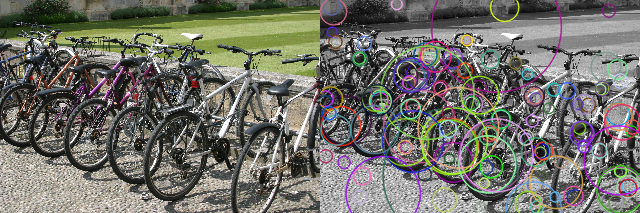

In [8]:
mser = cv2.MSER_create()

kp = mser.detect(img)

kp_img = cv2.drawKeypoints(bw_img, kp, 0, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
show([img, kp_img])

Here the detected keypoints are computed using **sift** descriptor. The result of this phase is an encoding of image throw a list of descriptors. These are vectors that describes the behavior of keypoints inside an image.

In [9]:
sift = cv2.xfeatures2d.SIFT_create()

kp, des = sift.compute(img, kp) 

print(des)

[[  0.   0.   0. ...  14. 139.  17.]
 [  0.   0.   0. ...  95. 113.  93.]
 [  0.   0.   0. ...   3.  42.   8.]
 ...
 [ 32.  24.  18. ...  77.  51.  18.]
 [  0.   0.   0. ...  50.  60.  58.]
 [  2.   3.  48. ...  20.  18.  40.]]


The following function it's able to create a list of *ImgData* appling **mser** detector and **sift** descriptor to different images related to the passed list of paths. Before mser the loaded image is converted in black and white version.

In [10]:
def detect_and_compute(paths):
  list_data = []
  for path in paths:
    img = cv2.imread(path)
    if img is not None and len(img) > 0:
      bw_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
      kp = mser.detect(bw_img)
      kp, des = sift.compute(bw_img, kp)
      list_data.append(ImgData(path, kp, des))
  return list_data

Now are initialized training and test set that are lists of ImgData that stores output information of **mser** and **sift** given the related paths.

In [11]:
TR_set = detect_and_compute(TR_set_paths)
TS_set = detect_and_compute(TS_set_paths)

### K-Means

The following is the function used to train the kmeans algorithm in a training set to extract a codebook. This is used then to create an histogram from each image that is a representation of it and is called Bag Of Features (BOF). An image is seen as an histogram that tracks the intensity of different features inside of it.

In [12]:
def kmeans_train(TR_set, n_clusters):
  stack_des = reduce(lambda x, y: np.vstack((x, y)), 
                  map(lambda x: x.des, 
                      filter(lambda x: x.des is not None, TR_set))
                  )
  normalized_stack = vq.whiten(stack_des)
  codebook, med = vq.kmeans(normalized_stack, n_clusters)
  return codebook, med

The function above is able to extract from codebook the information related to a single imgdata and assigning them to it. Histogram of image features is one of this information.

In [13]:
def kmeans_extraction(list_imgdata, codebook):
  for imgdata in list_imgdata:
    if imgdata.des is not None:
      normalized_des = vq.whiten(imgdata.des)
      code, med = vq.vq(normalized_des, codebook)
      histogram, bins = np.histogram(code, bins=range(codebook.shape[0] + 1))
      imgdata.histogram = list(enumerate(histogram))
      imgdata.code = code
      imgdata.med = med

The following code apply kmeans to a given dataset.

In [14]:
#@title K-Means Settings
n_clusters = 500#@param {type:"number", min: 1}
codebook, med = kmeans_train(TR_set, n_clusters)
kmeans_extraction(TR_set, codebook)

print(f"Mean Euclidean Distance: {med}")

Mean Euclidean Distance: 6.7784833908081055


Here are extracted BOF from test set and shown each histogram with the related image.

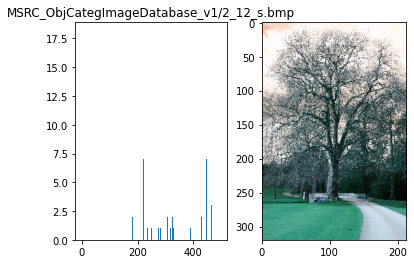

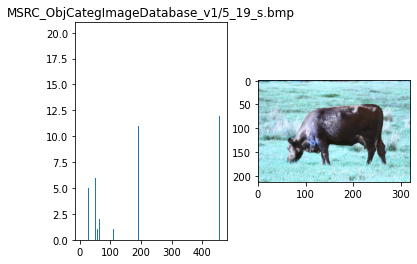

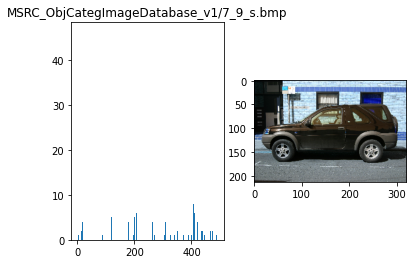

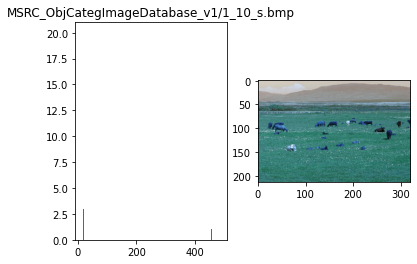

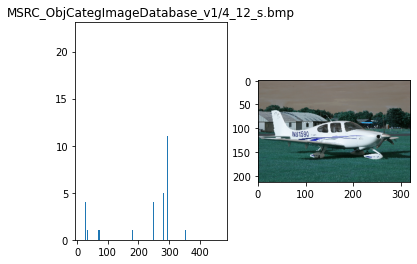

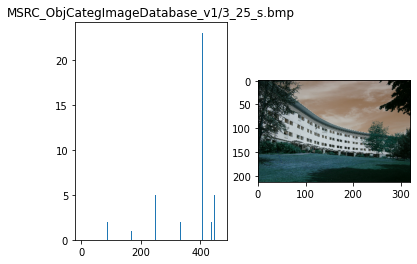

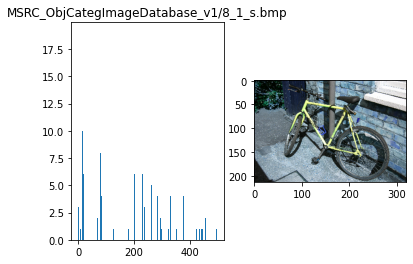

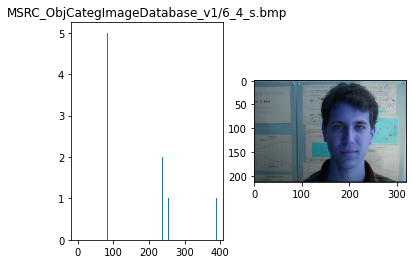

In [15]:
kmeans_extraction(TS_set, codebook)

for i, imgdata in enumerate(TS_set):
  fig, axs = plt.subplots(1, 2)
  axs[0].set_title(imgdata.path)
  axs[0].hist(imgdata.code, codebook.shape[0])
  axs[1].imshow(cv2.imread(imgdata.path))
  plt.show()

### LDA

This function prepare an **lda** model with the following hyperparameters:
- n_topics: number of topics that lda use to link images with topics and features with topics
- alpha: parameter that handle the mixing between topics. More it tends to zero more main topic probability ditributions tends to be high and others low.

In [16]:
def lda_train(alpha, n_topics, TR_set):
  unique_histogram = [imgdata.histogram for imgdata in TR_set if imgdata.histogram is not None]
  return LdaModel(unique_histogram, alpha=alpha, num_topics=n_topics, minimum_probability=0)

Above there is the function used to retrieve from each image of the test set the topics related to image and features. The extracted information are stored inside an *ImgData* object.

In [17]:
def lda_extraction(lda, TS_set):
  for imgdata in TS_set:
    img_topics, feature_topics, phi_values = lda.get_document_topics(imgdata.histogram, per_word_topics=True, minimum_probability=0) 
    imgdata.feature_topics = feature_topics
    imgdata.img_topics = img_topics

This code apply the lda to a given dataset.

In [18]:
#@title LDA Settings
alpha = 0.1#@param {type:"slider", min:0.01, max:1, step:0.01}
n_topics =  15#@param {type:"slider", min:1, max:50, step:1}
topics = Topic.create_list_topics(n_topics)

lda = lda_train(alpha, n_topics, TR_set)
lda_extraction(lda, TS_set)

The following function is able to create an image that shows detected topics coloring each detected keypoint. This is also capable to create a histogram of topic values assigned to the picture.

In [19]:
def topics_detection(imgdata, topics):
  selected_topics = []
  img = cv2.imread(imgdata.path)
  img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
  for i_code, kp in zip(imgdata.code, imgdata.kp):
    ordered_topics = imgdata.feature_topics[i_code][1]
    if len(ordered_topics) > 0:
      topic = topics[ordered_topics[0]]
      size = int(kp.size/2)
      pos = (int(kp.pt[0]), int(kp.pt[1]))
      img = cv2.drawKeypoints(img, [kp], 0, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=topic.color)
      img = cv2.putText(img, str(topic.id), pos, cv2.FONT_HERSHEY_SIMPLEX, size/50, topic.color, 1, 1)
      selected_topics.append(topic.id)
  selected_topic = np.array(np.argmax(np.bincount(selected_topics)))
  return img, selected_topic
  
def imgdata_topics_detection(list_imgdata, topics):
  for imgdata in list_imgdata:
    topics_detected_img, topic_id = topics_detection(imgdata, topics)
    imgdata.topics_detected_img = topics_detected_img
    topics[topic_id].list_imgdata.append(imgdata)

imgdata_topics_detection(TS_set, topics)

Function that prints for each topic inside a list the related images and the histogram with the list of topic values assigned to each image.

Topic 1


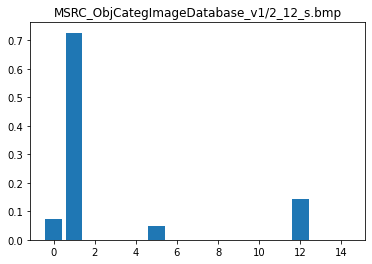

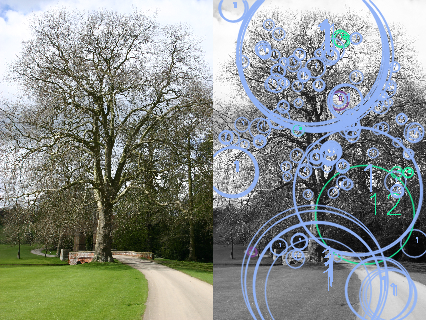

Topic 3


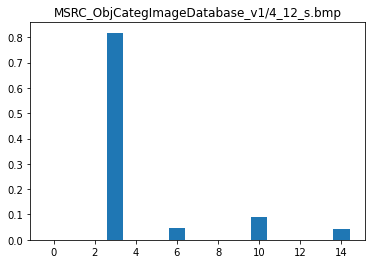

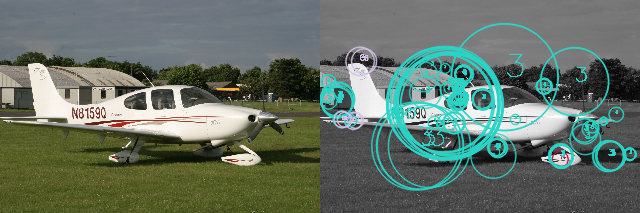

Topic 4


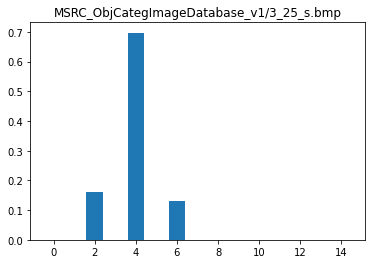

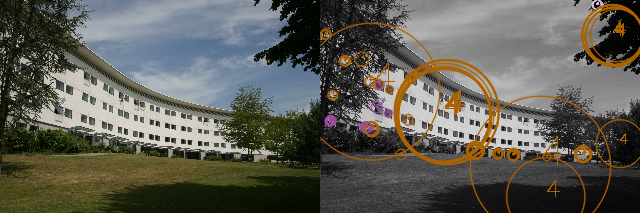

Topic 7


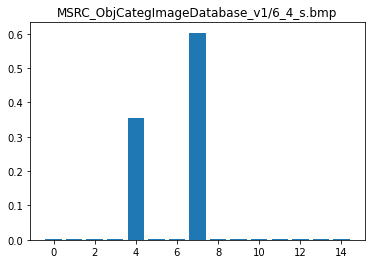

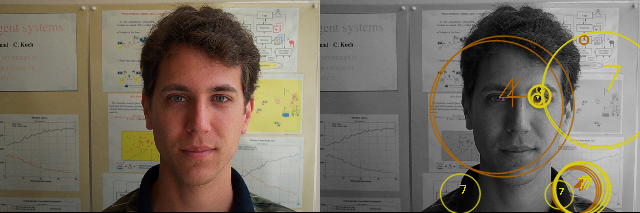

Topic 10


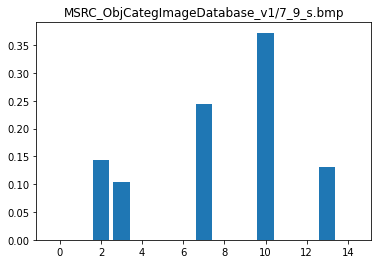

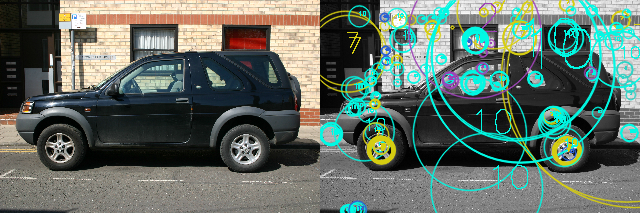

Topic 11


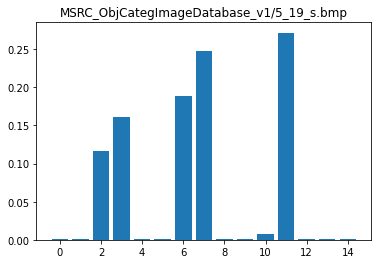

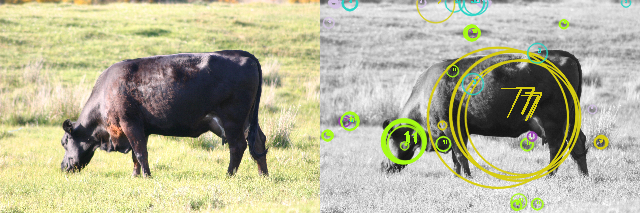

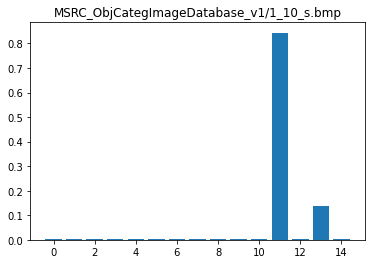

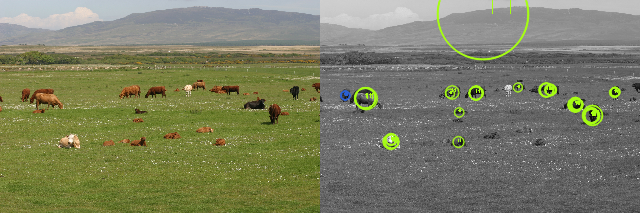

Topic 13


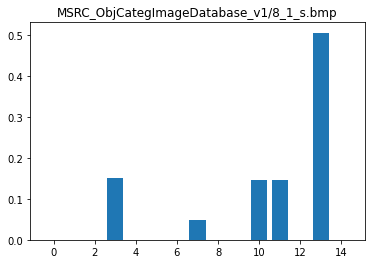

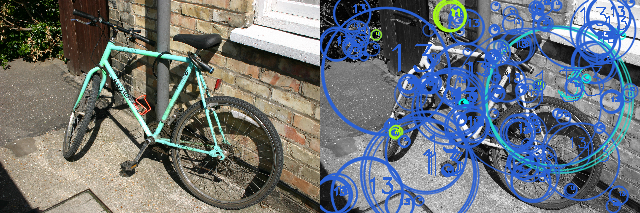

In [20]:
def show_topics_imgs(topics):
  for topic in topics:
    if len(topic.list_imgdata) > 0:
      print(topic.text)
      for imgdata in topic.list_imgdata:
        plt.title(imgdata.path)
        y = list(map(lambda x: x[1], imgdata.img_topics))
        plt.bar(range(len(imgdata.img_topics)), y, align='center')
        plt.show()
        show([cv2.imread(imgdata.path), imgdata.topics_detected_img])
  
show_topics_imgs(topics)

# Analysis

## Initialization

The following function wrap all the paths to link topics to the features of images.

In [21]:
def model_selection(dataset, n_clusters, alpha, n_topics):
  # MSER detector and SIFT descriptor
  TR_set = detect_and_compute(dataset[0])
  TS_set = detect_and_compute(dataset[1])
  # K-Means
  codebook, med = kmeans_train(TR_set, n_clusters)
  kmeans_extraction(TR_set, codebook)
  kmeans_extraction(TS_set, codebook)
  # LDA
  topics = Topic.create_list_topics(n_topics)
  lda = lda_train(alpha, n_topics, TR_set)
  lda_extraction(lda, TS_set)
  imgdata_topics_detection(TS_set, topics)
  show_topics_imgs(topics)

Here it's initialized the dataset used for the following experiments.

In [22]:
splitted_dataset = split_dataset(images_paths, n_ts_items=1)

## Alpha=0.1 - N_Topics=15

Topic 3


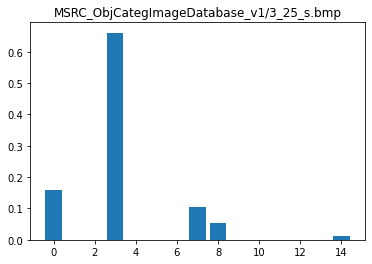

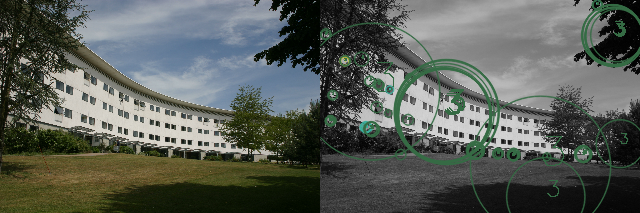

Topic 8


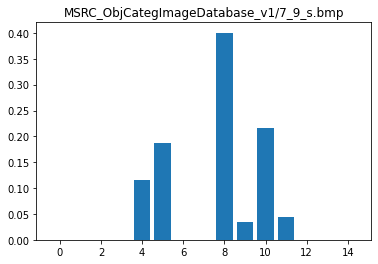

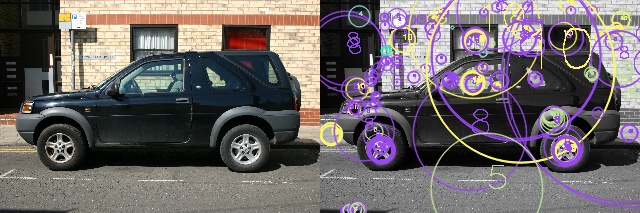

Topic 9


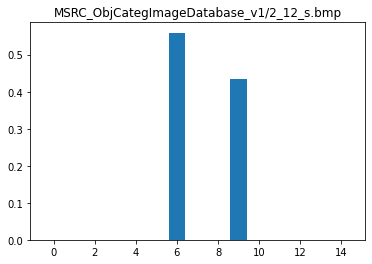

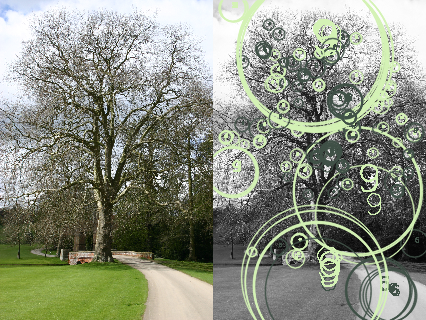

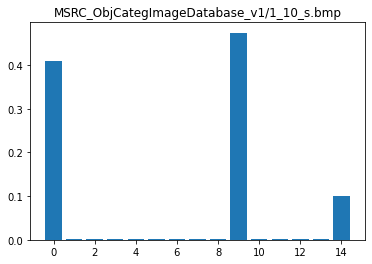

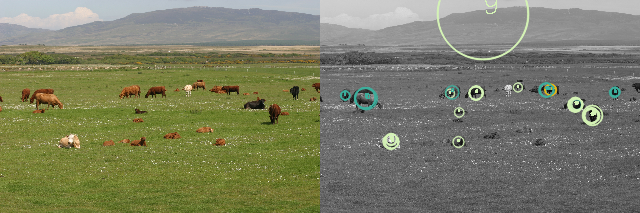

Topic 10


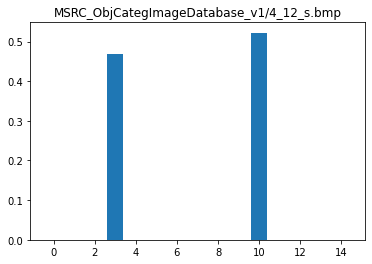

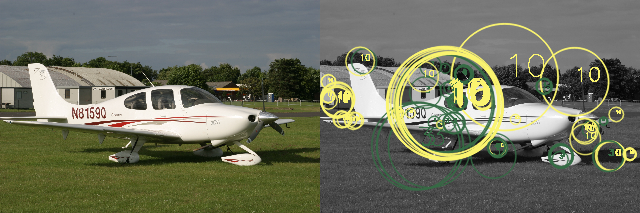

Topic 13


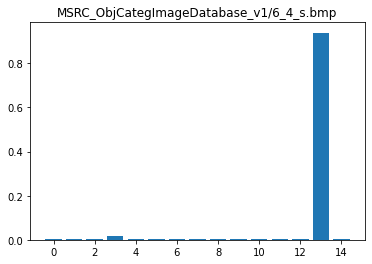

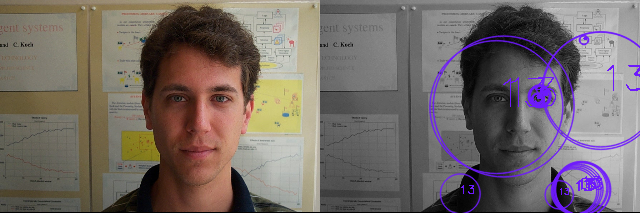

Topic 14


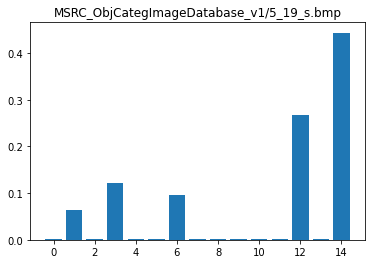

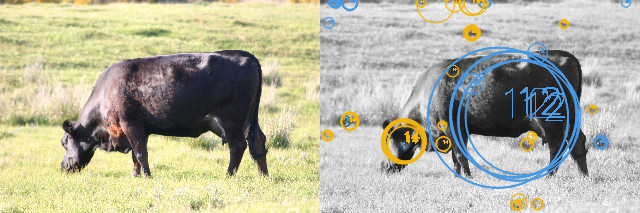

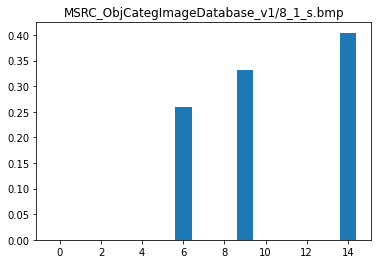

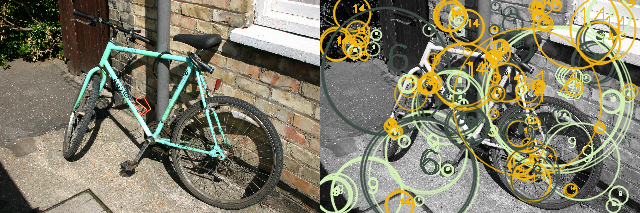

In [26]:
model_selection(splitted_dataset, n_clusters=500, alpha=0.1, n_topics=15)

## Alpha=1 - N_Topics=15

Topic 0


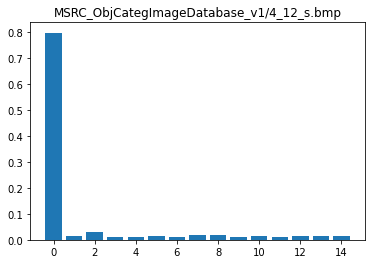

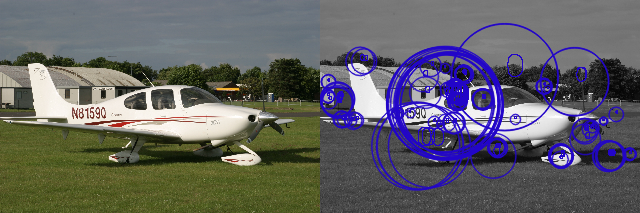

Topic 1


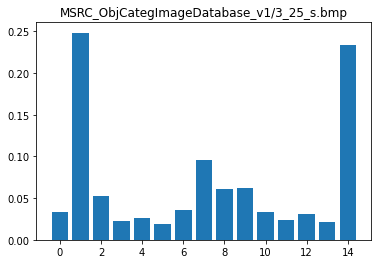

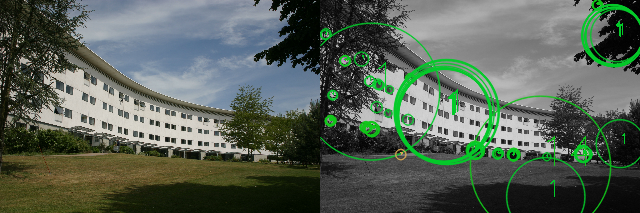

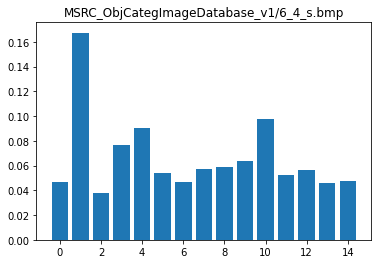

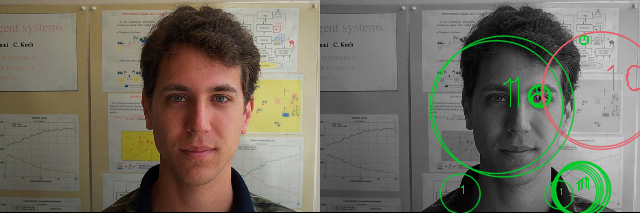

Topic 4


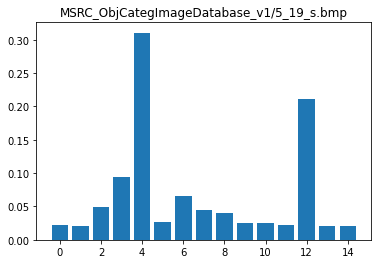

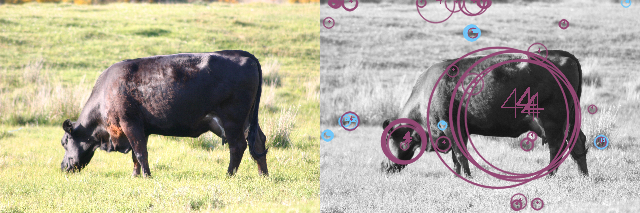

Topic 12


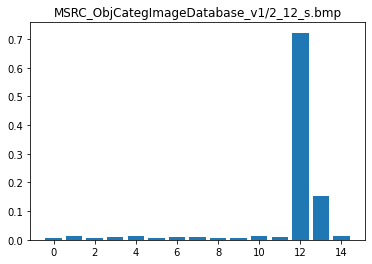

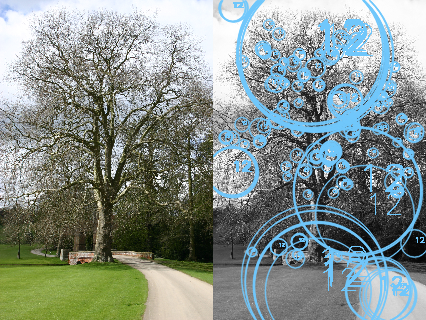

Topic 13


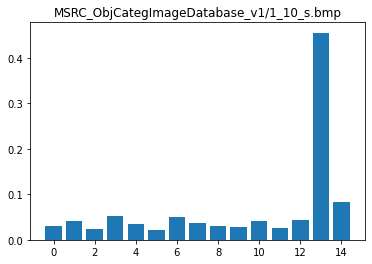

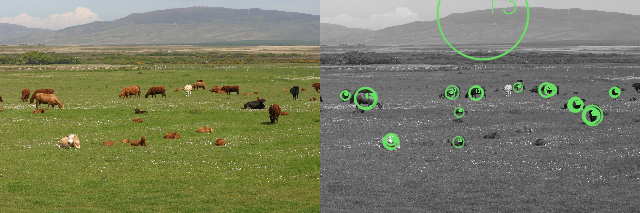

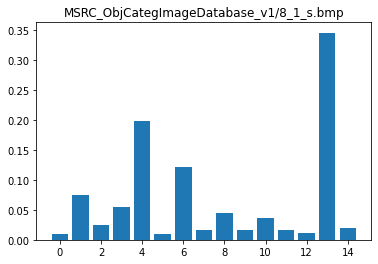

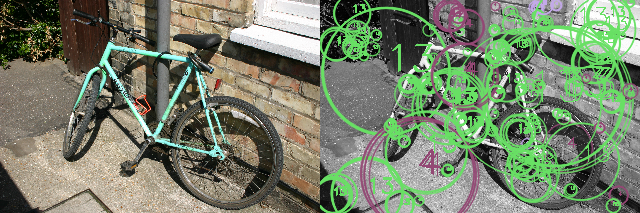

Topic 14


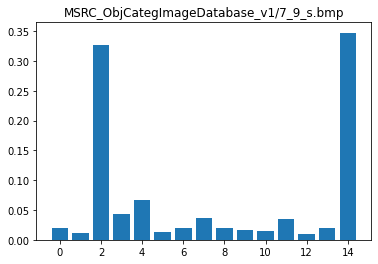

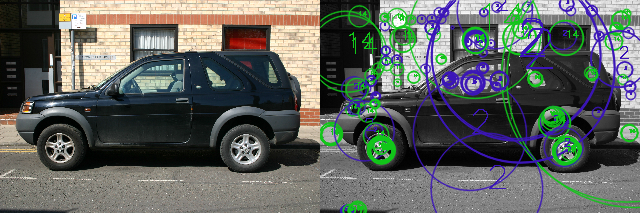

In [27]:
model_selection(splitted_dataset, n_clusters=500, alpha=1, n_topics=15)

## Alpha=0.1 - N_Topics=30

Topic 2


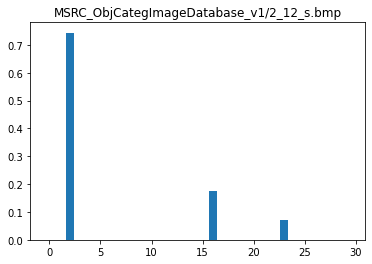

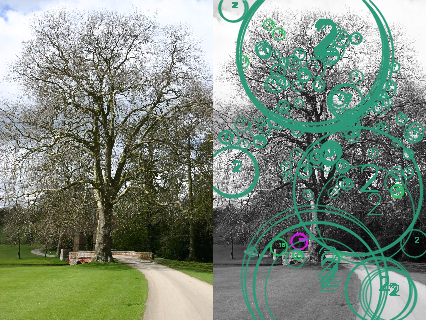

Topic 11


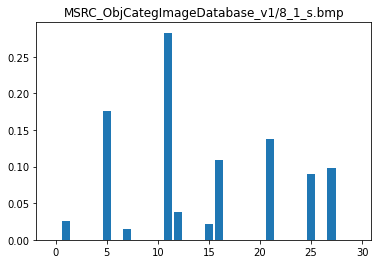

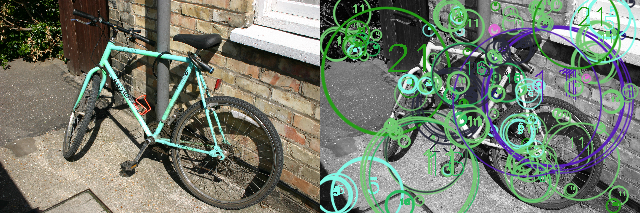

Topic 13


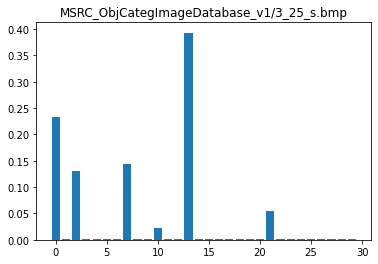

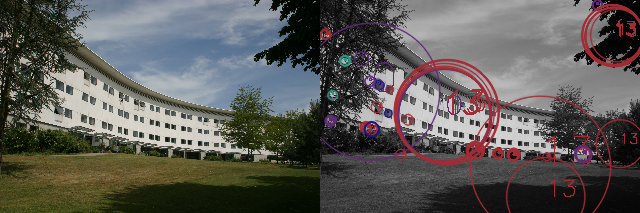

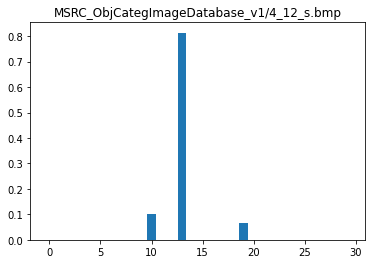

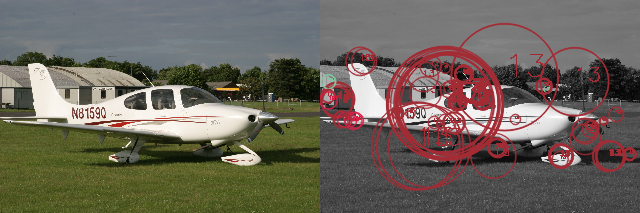

Topic 16


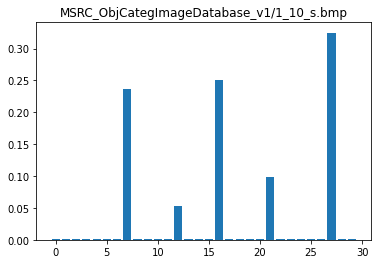

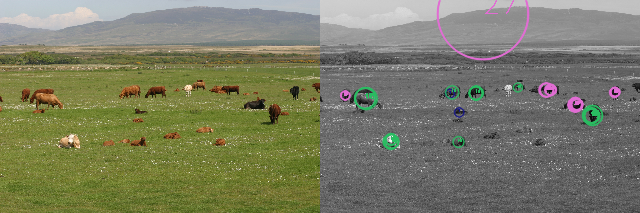

Topic 17


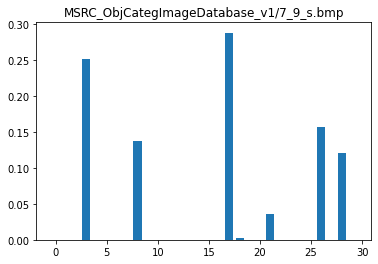

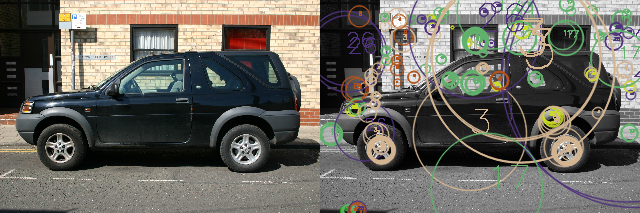

Topic 27


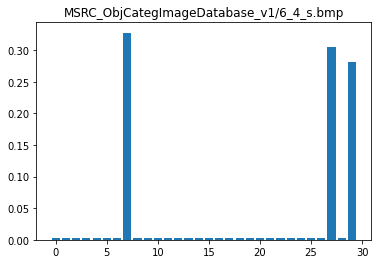

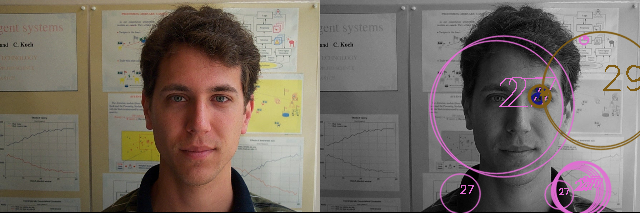

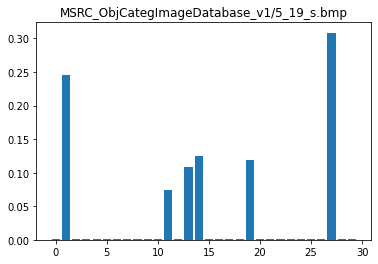

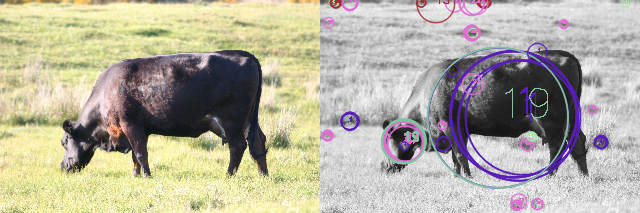

In [28]:
model_selection(splitted_dataset, n_clusters=500, alpha=0.1, n_topics=30)

## Alpha=1 - N_Topics=30

Topic 13


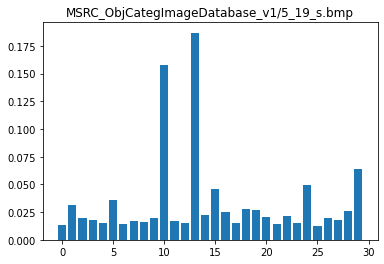

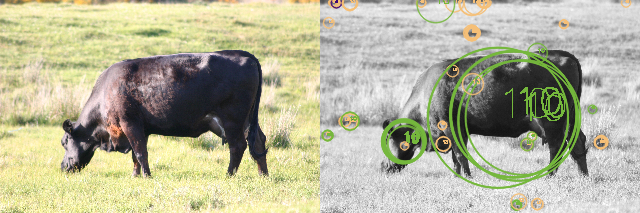

Topic 17


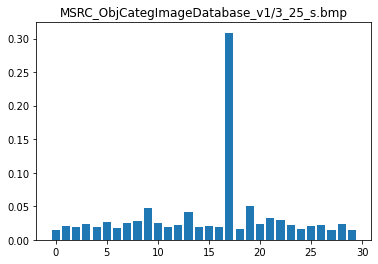

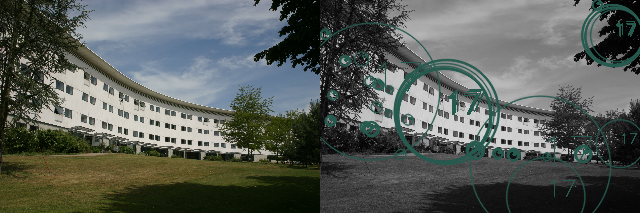

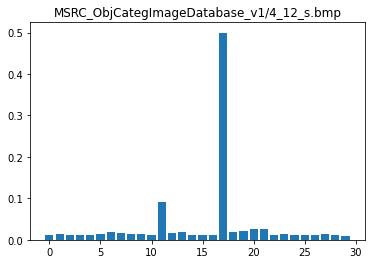

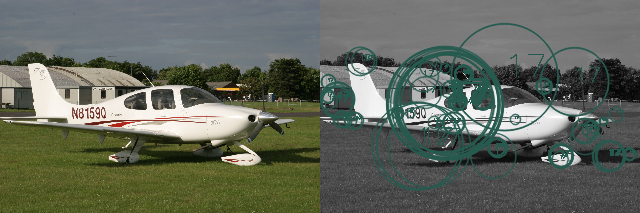

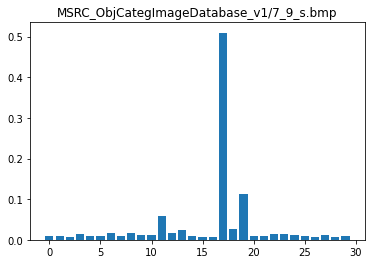

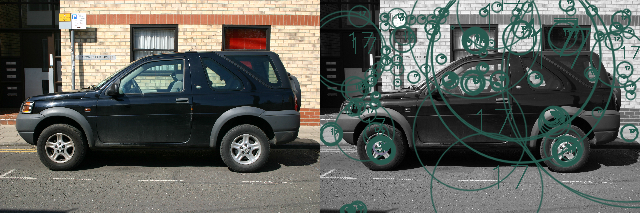

Topic 24


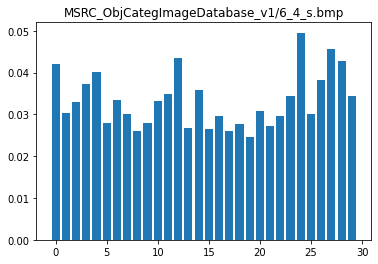

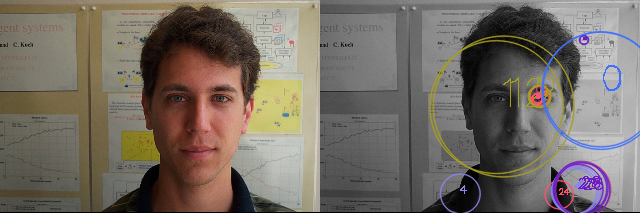

Topic 25


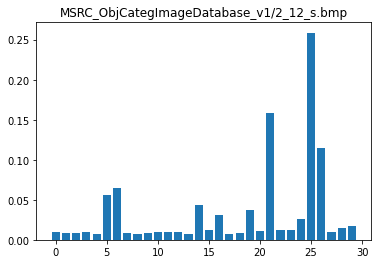

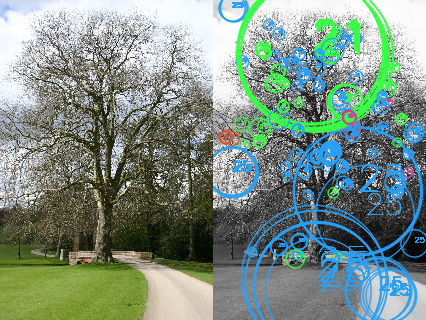

Topic 26


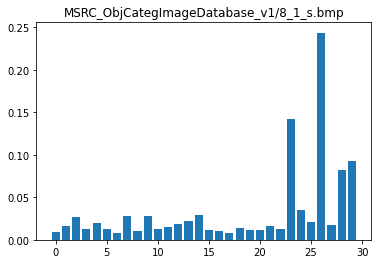

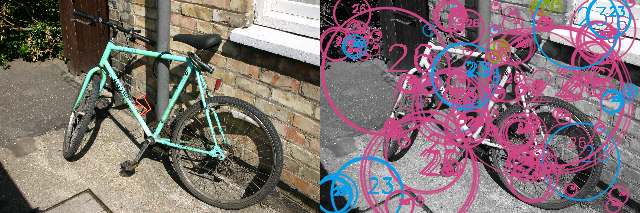

Topic 29


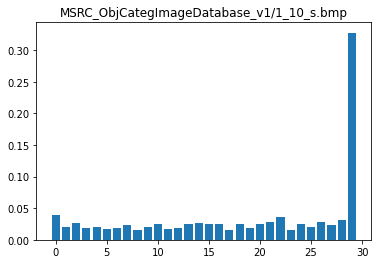

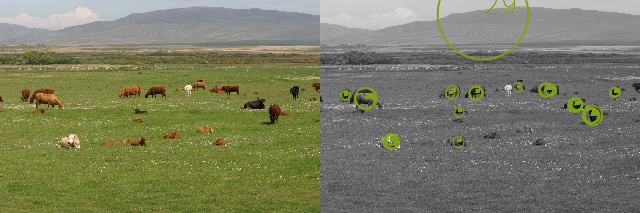

In [29]:
model_selection(splitted_dataset, n_clusters=500, alpha=1, n_topics=30)

# Conclusion

After these tests it's clear that Latent Dirichlet Allocation is ...